In [1]:
import numpy as np
import xarray as xr
import os
import fnmatch
from tqdm.autonotebook import tqdm
import dask

import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
%config InlineBackend.figure_format = 'retina'
import gcsfs
fs = gcsfs.GCSFileSystem() # equivalent to fsspec.fs('gs')

/tmp/ipykernel_1816/1802596382.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


Load output:

In [2]:
in_dir = '/home/jovyan/CMIP6cex/output/num_extremes/surge_g2_pr_tgs/40yr_p98_lag0d_declus1d_ref2000/'
output_files = []
ssps = ['ssp245','ssp585']

source_ids = [k for k in os.listdir(in_dir) if ~k.startswith('.')]

for s,ssp in enumerate(ssps):
    models = []
    for so,source_id in enumerate(source_ids): #loop over models
        model_path = os.path.join(in_dir,source_id)
        model_ssp_ds = {}

        files = [os.path.join(model_path,f) for f in os.listdir(model_path) if ssp in f]
        if len(files)>0:
            model_ds = xr.open_mfdataset(files,concat_dim='member_id',combine='nested',coords='minimal',compat='override',join='outer').chunk(member_id=100)
            models.append(source_id)
        else:
            continue

        if so==0:
            ssp_ds = model_ds
        else:
            ssp_ds = xr.concat((ssp_ds,model_ds),dim='source_id',coords='minimal',join='outer',compat='override')
            
    ssp_ds = ssp_ds.assign_coords({'source_id':models})   
    
    
    if s==0:
        ds = ssp_ds
    else:
        ds = xr.concat((ds,ssp_ds),dim='ssp')
ds = ds.assign_coords({'ssp':ssps})

ds = ds.sel(window=slice(1980,2100))

complete = ds.complete_window.sel(window=slice(1980,2100)).sum(dim='window')==len(ds.complete_window.sel(window=slice(1980,2100)).window)
ds = ds.where(complete) #require runs to be complete from 1970 to 2100

ds_intersect = ds.where(np.isfinite(ds.complete_window.isel(window=-1)).all(dim=['ssp','tg'])) #only consider where we have both SSPs

#plot changes in number of joint extremes
n_sp = ds_intersect[['num_joint_extremes','num_joint_extremes_pr_driven','num_joint_extremes_surge_driven','num_joint_extremes_surge_pr_driven']]
n_sp = n_sp.load()
n_sp=n_sp.where(n_sp.tg!='le_pellerin_.csv')
n_sp = n_sp.where(n_sp.tg!='nantes_usine_brulee_.csv')

In [3]:
in_dir = '/home/jovyan/CMIP6cex/output/num_extremes/sfcWind_pr_tgs/40yr_p98_lag0d_declus1d_ref2000/'
output_files = []
ssps = ['ssp245','ssp585']

source_ids = [k for k in os.listdir(in_dir) if ~k.startswith('.')]

for s,ssp in enumerate(ssps):
    models = []
    for so,source_id in enumerate(source_ids): #loop over models
        model_path = os.path.join(in_dir,source_id)
        model_ssp_ds = {}

        files = [os.path.join(model_path,f) for f in os.listdir(model_path) if ssp in f]
        if len(files)>0:
            model_ds = xr.open_mfdataset(files,concat_dim='member_id',combine='nested',coords='minimal',compat='override',join='outer').chunk(member_id=100)
            models.append(source_id)
        else:
            continue

        if so==0:
            ssp_ds = model_ds
        else:
            ssp_ds = xr.concat((ssp_ds,model_ds),dim='source_id',coords='minimal',join='outer',compat='override')
            
    ssp_ds = ssp_ds.assign_coords({'source_id':models})   
    
    
    if s==0:
        ds = ssp_ds
    else:
        ds = xr.concat((ds,ssp_ds),dim='ssp')
ds = ds.assign_coords({'ssp':ssps})

ds = ds.sel(window=slice(1980,2100))

complete = ds.complete_window.sel(window=slice(1980,2100)).sum(dim='window')==len(ds.complete_window.sel(window=slice(1980,2100)).window)
ds = ds.where(complete) #require runs to be complete from 1970 to 2100

ds_intersect = ds.where(np.isfinite(ds.complete_window.isel(window=-1)).all(dim=['ssp','tg'])) #only consider where we have both SSPs

#plot changes in number of joint extremes
n_wp = ds_intersect[['num_joint_extremes','num_joint_extremes_pr_driven','num_joint_extremes_sfcWind_driven','num_joint_extremes_sfcWind_pr_driven']]
n_wp = n_wp.load()
n_wp = n_wp.where(n_wp.tg!='nantes_usine_brulee_.csv')
n_wp=n_wp.where(n_wp.tg!='le_pellerin_.csv')
    

In [4]:
num_extremes_mlr_eval = xr.open_dataset('mlr_evaluation.nc').sel(threshold=.98)

<xarray.DataArray 'num_joint_extremes' ()>
array(36.46242608)
Coordinates:
    quantile  float64 0.98
    ssp       <U6 'ssp245'
    window    int64 2000
<xarray.DataArray 'num_joint_extremes' ()>
array(49.74050681)
Coordinates:
    quantile  float64 0.98
    ssp       <U6 'ssp585'
    window    int64 2000


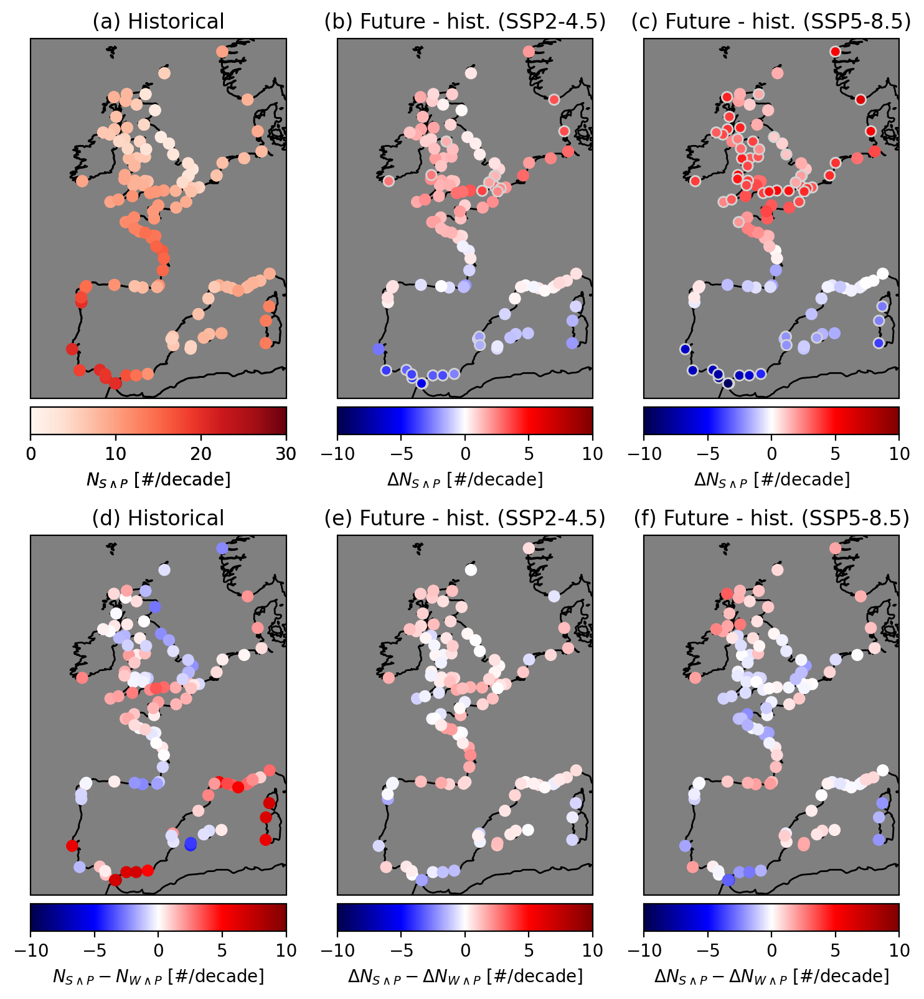

In [5]:
fig=plt.figure(figsize=(9,9.5)) #generate figure  
gs = fig.add_gridspec(2,3)
gs.update(hspace=.2)

    
for s,ssp in enumerate(ssps):
    n_wp_ds = n_wp.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    n_sp_ds = n_sp.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    
    n_wp_ds_present = n_wp_ds.sel(window=2000)#.sel(window=2005)
    n_wp_ds_future = n_wp_ds.sel(window=2080)#.sel(window=2085)
    n_wp_ds_diff = n_wp_ds_future - n_wp_ds_present

    n_sp_ds_present = n_sp_ds.sel(window=2000)#.sel(window=2005)
    n_sp_ds_future = n_sp_ds.sel(window=2080)#.sel(window=2085)
    n_sp_ds_diff = n_sp_ds_future - n_sp_ds_present
    

    #historical
    ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))
    
    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    

    sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=(.25*n_sp_ds_present.mean(dim='member_id').mean(dim='source_id')),cmap='Reds',vmin=0,vmax=30,transform=ccrs.PlateCarree(),zorder=3)
    
    ax.coastlines(zorder=1)
    #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*n_wp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
    
    #cax=ax.inset_axes(width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{S\wedge P}$ [#/decade]')
    ax.set_title('(a) Historical')
    
    #SSP
    ax = plt.subplot(gs[0,s+1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    mean_lt_std = np.abs(n_sp_ds_diff.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon[mean_lt_std],ssp_ds.lat[mean_lt_std],c=(.25*n_sp_ds_diff.mean(dim='member_id').mean(dim='source_id'))[mean_lt_std],cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)
    sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*n_sp_ds_diff.mean(dim='member_id').mean(dim='source_id'))[~mean_lt_std],cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
    
    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    #cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title(['(b) Future - hist. (SSP2-4.5)','(c) Future - hist. (SSP5-8.5)'][s])
    
    pct_change = (100*np.abs(n_sp_ds_diff)/n_sp_ds_present).mean(dim='member_id').mean(dim='source_id')
    pct_change = pct_change.where(np.isfinite(pct_change)) 
    print(np.mean(pct_change))

    if s==0:
        #historical
        ax = plt.subplot(gs[1,0],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


        sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*(n_sp_ds_present-n_wp_ds_present).mean(dim='member_id').mean(dim='source_id'),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)

        ax.coastlines(zorder=1)
        #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*n_wp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        cax=ax.inset_axes(bounds=(0, -.1,1,.075))
        #cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{S\wedge P} - N_{W\wedge P}$ [#/decade]')
        ax.set_title('(d) Historical')

    #SSP
    ax = plt.subplot(gs[1,s+1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*(n_sp_ds_diff-n_wp_ds_diff).mean(dim='member_id').mean(dim='source_id'),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    #cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title(['(e) Future - hist. (SSP2-4.5)','(f) Future - hist. (SSP5-8.5)'][s])

#fig.savefig('Figures/ensmean_dN_SP_v2.pdf',format='pdf',dpi=300,bbox_inches='tight')


<xarray.DataArray 'num_joint_extremes' ()>
array(36.46242608)
Coordinates:
    quantile  float64 0.98
    ssp       <U6 'ssp245'
    window    int64 2000
<xarray.DataArray 'num_joint_extremes' ()>
array(49.74050681)
Coordinates:
    quantile  float64 0.98
    ssp       <U6 'ssp585'
    window    int64 2000


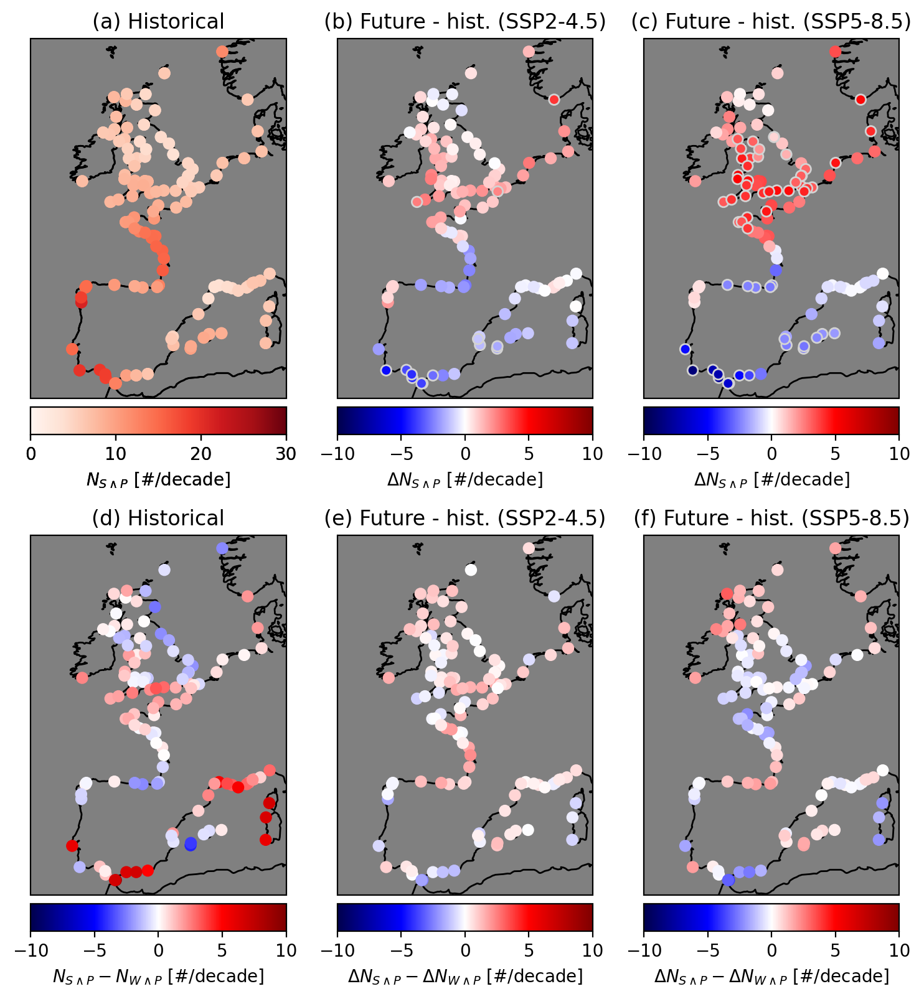

In [6]:
fig=plt.figure(figsize=(9,9.5)) #generate figure  
gs = fig.add_gridspec(2,3)
gs.update(hspace=.2)

    
for s,ssp in enumerate(ssps):
    n_wp_ds = n_wp.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    n_sp_ds = n_sp.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    
    n_wp_ds_present = n_wp_ds.sel(window=2000)#.sel(window=2005)
    n_wp_ds_future = n_wp_ds.sel(window=2080)#.sel(window=2085)
    n_wp_ds_diff = n_wp_ds_future - n_wp_ds_present

    n_sp_ds_present = n_sp_ds.sel(window=2000)#.sel(window=2005)
    n_sp_ds_future = n_sp_ds.sel(window=2080)#.sel(window=2085)
    n_sp_ds_diff = n_sp_ds_future - n_sp_ds_present
    

    #historical
    ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))
    
    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    

    sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=(.25*n_wp_ds_present.mean(dim='member_id').mean(dim='source_id')),cmap='Reds',vmin=0,vmax=30,transform=ccrs.PlateCarree(),zorder=3)
    
    ax.coastlines(zorder=1)
    #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*n_wp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
    
    #cax=ax.inset_axes(width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{S\wedge P}$ [#/decade]')
    ax.set_title('(a) Historical')
    
    #SSP
    ax = plt.subplot(gs[0,s+1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    mean_lt_std = np.abs(n_wp_ds_diff.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon[mean_lt_std],ssp_ds.lat[mean_lt_std],c=(.25*n_wp_ds_diff.mean(dim='member_id').mean(dim='source_id'))[mean_lt_std],cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)
    sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*n_wp_ds_diff.mean(dim='member_id').mean(dim='source_id'))[~mean_lt_std],cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
    
    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    #cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title(['(b) Future - hist. (SSP2-4.5)','(c) Future - hist. (SSP5-8.5)'][s])
    
    pct_change = (100*np.abs(n_sp_ds_diff)/n_sp_ds_present).mean(dim='member_id').mean(dim='source_id')
    pct_change = pct_change.where(np.isfinite(pct_change)) 
    print(np.mean(pct_change))

    if s==0:
        #historical
        ax = plt.subplot(gs[1,0],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


        sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*(n_sp_ds_present-n_wp_ds_present).mean(dim='member_id').mean(dim='source_id'),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)

        ax.coastlines(zorder=1)
        #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*n_wp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        cax=ax.inset_axes(bounds=(0, -.1,1,.075))
        #cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{S\wedge P} - N_{W\wedge P}$ [#/decade]')
        ax.set_title('(d) Historical')

    #SSP
    ax = plt.subplot(gs[1,s+1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*(n_sp_ds_diff-n_wp_ds_diff).mean(dim='member_id').mean(dim='source_id'),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    #cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title(['(e) Future - hist. (SSP2-4.5)','(f) Future - hist. (SSP5-8.5)'][s])

#fig.savefig('Figures/ensmean_dN_SP_v2.pdf',format='pdf',dpi=300,bbox_inches='tight')


In [7]:
pct_change = (100*np.abs(n_sp_ds_diff)/n_sp_ds_present).mean(dim='member_id').mean(dim='source_id')
pct_change = pct_change.where(np.isfinite(pct_change)) 
np.mean(pct_change)

<xarray.DataArray 'num_joint_extremes' ()>
array(49.74050681)
Coordinates:
    quantile  float64 0.98
    ssp       <U6 'ssp585'
    window    int64 2000

In [8]:
xr.corr(num_extremes_mlr_eval.num_cooc_g3,.25*n_sp_ds_present.mean(dim='member_id').mean(dim='source_id'),dim='tg')

<xarray.DataArray ()>
array(0.76201114)
Coordinates:
    quantile   float64 0.98
    threshold  float64 0.98
    window     int64 2000
    ssp        <U6 'ssp585'

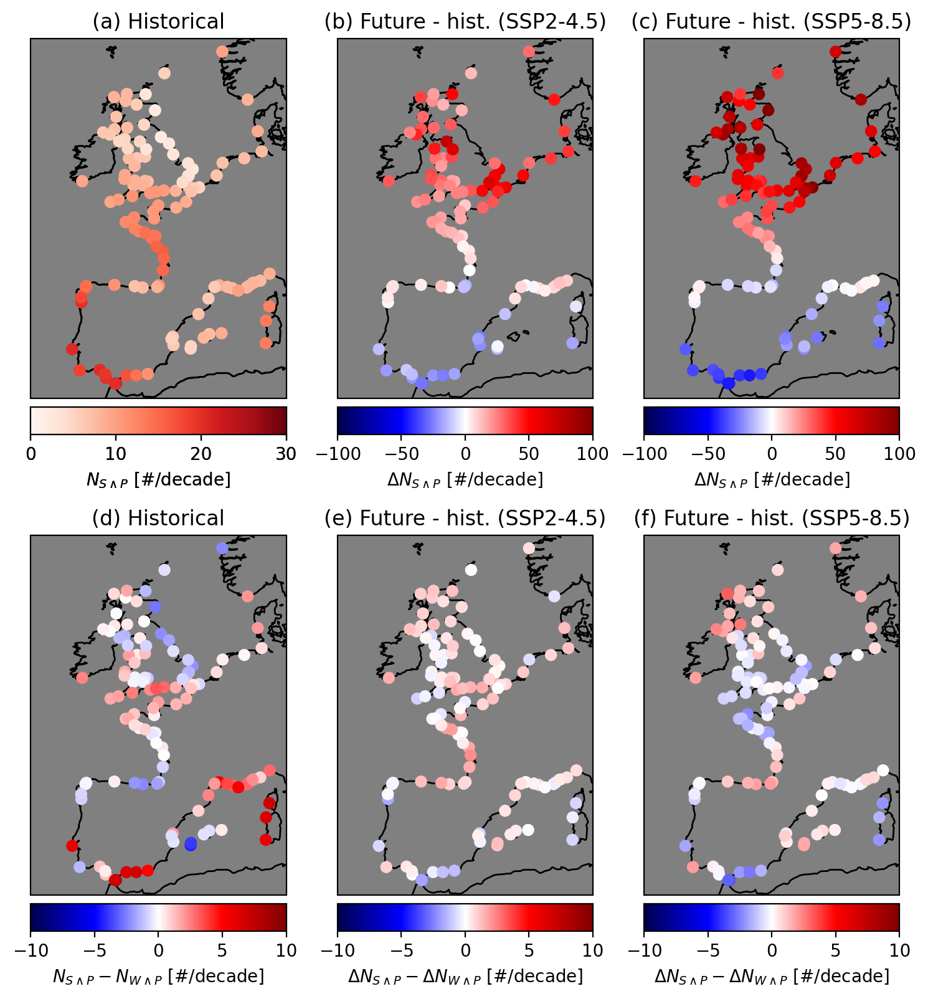

In [9]:
fig=plt.figure(figsize=(9,9.5)) #generate figure  
gs = fig.add_gridspec(2,3)
gs.update(hspace=.2)

    
for s,ssp in enumerate(ssps):
    n_wp_ds = n_wp.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    n_sp_ds = n_sp.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    
    n_wp_ds_present = n_wp_ds.sel(window=2000)#.sel(window=2005)
    n_wp_ds_future = n_wp_ds.sel(window=2080)#.sel(window=2085)
    n_wp_ds_diff = n_wp_ds_future - n_wp_ds_present

    n_sp_ds_present = n_sp_ds.sel(window=2000)#.sel(window=2005)
    n_sp_ds_future = n_sp_ds.sel(window=2080)#.sel(window=2085)
    n_sp_ds_diff = n_sp_ds_future - n_sp_ds_present


    #historical
    ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


    sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=(.25*n_sp_ds_present.mean(dim='member_id').mean(dim='source_id')),cmap='Reds',vmin=0,vmax=30,transform=ccrs.PlateCarree(),zorder=3)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*n_wp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{S\wedge P}$ [#/decade]')
    ax.set_title('(a) Historical')

    #SSP
    ax = plt.subplot(gs[0,s+1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    mean_lt_std = np.abs(n_sp_ds_diff.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(100*n_sp_ds_diff/n_sp_ds_present).mean(dim='member_id').mean(dim='source_id'),cmap='seismic',vmin=-100,vmax=100,transform=ccrs.PlateCarree(),zorder=4)
    #sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*n_sp_ds_diff.mean(dim='member_id').mean(dim='source_id'))[~mean_lt_std],cmap='seismic',vmin=-100,vmax=100,transform=ccrs.PlateCarree(),zorder=3)
    
    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title(['(b) Future - hist. (SSP2-4.5)','(c) Future - hist. (SSP5-8.5)'][s])


    if s==0:
        #historical
        ax = plt.subplot(gs[1,0],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


        sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*(n_sp_ds_present-n_wp_ds_present).mean(dim='member_id').mean(dim='source_id'),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)

        ax.coastlines(zorder=1)
        #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*n_wp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

        cax=ax.inset_axes(bounds=(0, -.1,1,.075))
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{S\wedge P} - N_{W\wedge P}$ [#/decade]')
        ax.set_title('(d) Historical')

    #SSP
    ax = plt.subplot(gs[1,s+1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*(n_sp_ds_diff-n_wp_ds_diff).mean(dim='member_id').mean(dim='source_id'),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title(['(e) Future - hist. (SSP2-4.5)','(f) Future - hist. (SSP5-8.5)'][s])

#fig.savefig('Figures/ensmean_dN_SP_v2.pdf',format='pdf',dpi=300,bbox_inches='tight')


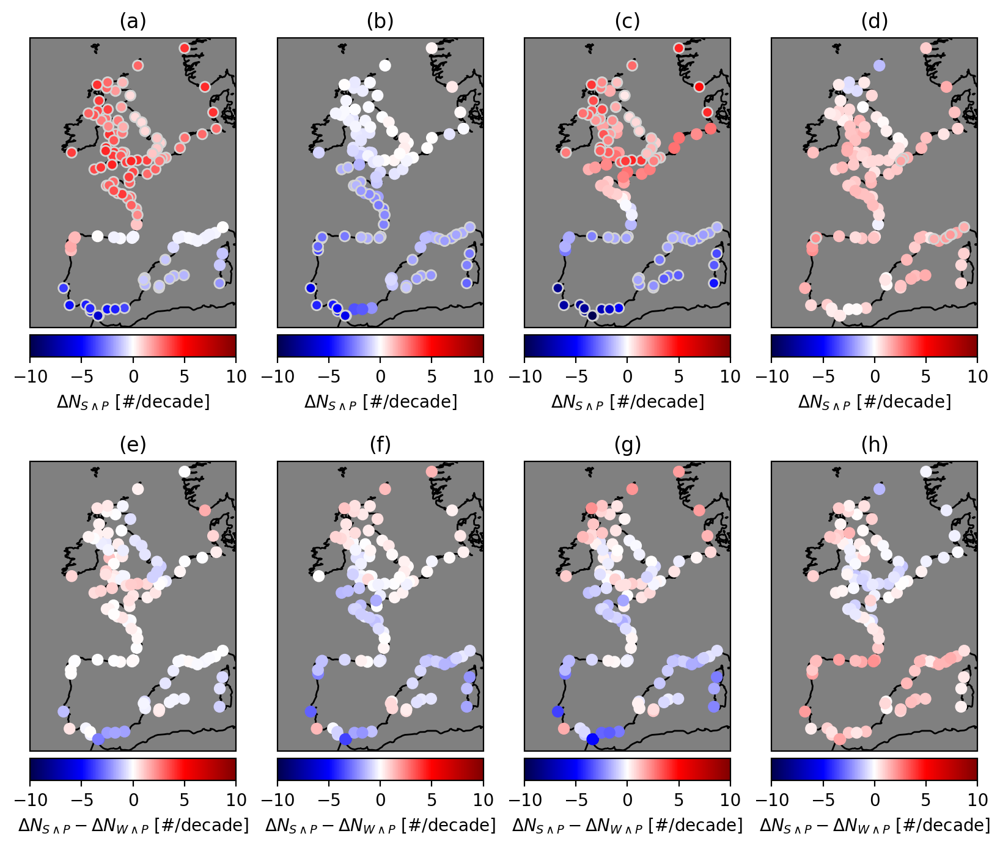

In [10]:
fig=plt.figure(figsize=(10,8.25)) #generate figure  
gs = fig.add_gridspec(2,4)
gs.update(hspace=.2)

    
for s,ssp in enumerate(['ssp585']):
    n_wp_ds = n_wp.sel(ssp=ssp).sum(dim='month',skipna=False)
    n_sp_ds = n_sp.sel(ssp=ssp).sum(dim='month',skipna=False)
    
    n_wp_ds_present = n_wp_ds.sel(window=2000)#.sel(window=2005)
    n_wp_ds_future = n_wp_ds.sel(window=2080)#.sel(window=2085)
    n_wp_ds_diff = n_wp_ds_future - n_wp_ds_present

    n_sp_ds_present = n_sp_ds.sel(window=2000)#.sel(window=2005)
    n_sp_ds_future = n_sp_ds.sel(window=2080)#.sel(window=2085)
    n_sp_ds_diff = n_sp_ds_future - n_sp_ds_present

    #SSP
    ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    mean_lt_std = np.abs(n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon[mean_lt_std],ssp_ds.lat[mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id')[mean_lt_std]),cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=5)
    sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id')[~mean_lt_std]),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(a)')
    
    
    ax = plt.subplot(gs[0,1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
        
    mean_lt_std = np.abs(n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon[mean_lt_std],ssp_ds.lat[mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').mean(dim='source_id')[mean_lt_std]),cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=5)
    sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').mean(dim='source_id')[~mean_lt_std]),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(b)')
    
    ax = plt.subplot(gs[0,2],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    mean_lt_std = np.abs(n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon[mean_lt_std],ssp_ds.lat[mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').mean(dim='source_id')[mean_lt_std]),cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=5)
    sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').mean(dim='source_id')[~mean_lt_std]),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(c)')
    
    
    ax = plt.subplot(gs[0,3],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    dependence_driven = (n_sp_ds_diff.num_joint_extremes-n_sp_ds_diff.num_joint_extremes_surge_pr_driven)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)
    
    mean_lt_std = np.abs(dependence_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dependence_driven.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon[mean_lt_std],ssp_ds.lat[mean_lt_std],c=(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id')[mean_lt_std]),cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=5)
    sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id')[~mean_lt_std]),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    
    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(d)')
    
    
    
    ##### ##### ##### ##### #####
    ax = plt.subplot(gs[1,0],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*(n_sp_ds_diff.num_joint_extremes_pr_driven-n_wp_ds_diff.num_joint_extremes_pr_driven).mean(dim='member_id').mean(dim='source_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title('(e)')
    
    
    ax = plt.subplot(gs[1,1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*(n_sp_ds_diff.num_joint_extremes_surge_driven-n_wp_ds_diff.num_joint_extremes_sfcWind_driven).mean(dim='member_id').mean(dim='source_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title('(f)')
    
    ax = plt.subplot(gs[1,2],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*(n_sp_ds_diff.num_joint_extremes_surge_pr_driven-n_wp_ds_diff.num_joint_extremes_sfcWind_pr_driven).mean(dim='member_id').mean(dim='source_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title('(g)')
    
    
    ax = plt.subplot(gs[1,3],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    dependence_driven_sp = (n_sp_ds_diff.num_joint_extremes-n_sp_ds_diff.num_joint_extremes_surge_pr_driven)
    dependence_driven_wp = (n_wp_ds_diff.num_joint_extremes-n_wp_ds_diff.num_joint_extremes_sfcWind_pr_driven)
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*(dependence_driven_sp-dependence_driven_wp).mean(dim='member_id').mean(dim='source_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title('(h)')
    
#fig.savefig('Figures/ensmean_dN_SP_decomp.jpg',format='jpg',dpi=300,bbox_inches='tight')


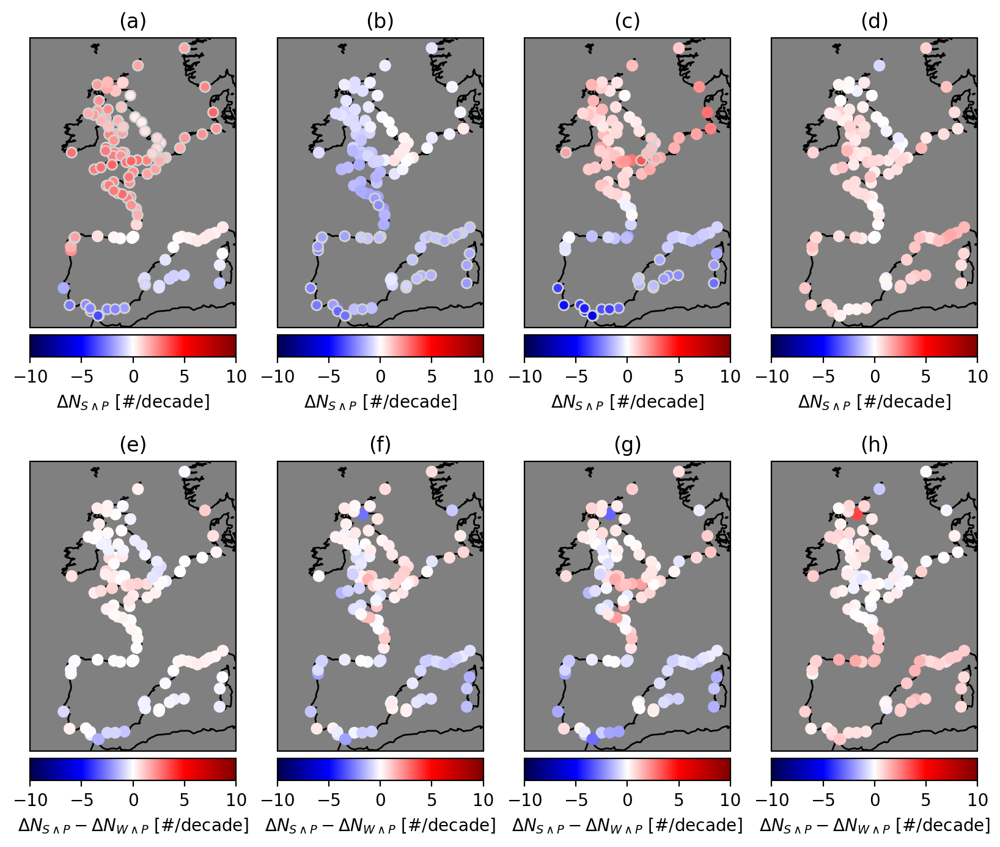

In [11]:
fig=plt.figure(figsize=(10,8.25)) #generate figure  
gs = fig.add_gridspec(2,4)
gs.update(hspace=.2)

    
for s,ssp in enumerate(['ssp245']):
    n_wp_ds = n_wp.sel(ssp=ssp).sum(dim='month',skipna=False)
    n_sp_ds = n_sp.sel(ssp=ssp).sum(dim='month',skipna=False)
    
    n_wp_ds_present = n_wp_ds.sel(window=2000)#.sel(window=2005)
    n_wp_ds_future = n_wp_ds.sel(window=2080)#.sel(window=2085)
    n_wp_ds_diff = n_wp_ds_future - n_wp_ds_present

    n_sp_ds_present = n_sp_ds.sel(window=2000)#.sel(window=2005)
    n_sp_ds_future = n_sp_ds.sel(window=2080)#.sel(window=2085)
    n_sp_ds_diff = n_sp_ds_future - n_sp_ds_present

    #SSP
    ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    mean_lt_std = np.abs(n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon[mean_lt_std],ssp_ds.lat[mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id')[mean_lt_std]),cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=5)
    sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id')[~mean_lt_std]),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(a)')
    
    
    ax = plt.subplot(gs[0,1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
        
    mean_lt_std = np.abs(n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon[mean_lt_std],ssp_ds.lat[mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').mean(dim='source_id')[mean_lt_std]),cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=5)
    sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').mean(dim='source_id')[~mean_lt_std]),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(b)')
    
    ax = plt.subplot(gs[0,2],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    mean_lt_std = np.abs(n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon[mean_lt_std],ssp_ds.lat[mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').mean(dim='source_id')[mean_lt_std]),cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=5)
    sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').mean(dim='source_id')[~mean_lt_std]),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(c)')
    
    
    ax = plt.subplot(gs[0,3],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    dependence_driven = (n_sp_ds_diff.num_joint_extremes-n_sp_ds_diff.num_joint_extremes_surge_pr_driven)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)
    
    mean_lt_std = np.abs(dependence_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dependence_driven.mean(dim='member_id').std(dim='source_id'))
    
    sc=ax.scatter(ssp_ds.lon[mean_lt_std],ssp_ds.lat[mean_lt_std],c=(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id')[mean_lt_std]),cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=5)
    sc=ax.scatter(ssp_ds.lon[~mean_lt_std],ssp_ds.lat[~mean_lt_std],c=(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id')[~mean_lt_std]),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    
    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(d)')
    
    
    
    ##### ##### ##### ##### #####
    ax = plt.subplot(gs[1,0],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*(n_sp_ds_diff.num_joint_extremes_pr_driven-n_wp_ds_diff.num_joint_extremes_pr_driven).mean(dim='member_id').mean(dim='source_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title('(e)')
    
    
    ax = plt.subplot(gs[1,1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*(n_sp_ds_diff.num_joint_extremes_surge_driven-n_wp_ds_diff.num_joint_extremes_sfcWind_driven).mean(dim='member_id').mean(dim='source_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title('(f)')
    
    ax = plt.subplot(gs[1,2],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*(n_sp_ds_diff.num_joint_extremes_surge_pr_driven-n_wp_ds_diff.num_joint_extremes_sfcWind_pr_driven).mean(dim='member_id').mean(dim='source_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title('(g)')
    
    
    ax = plt.subplot(gs[1,3],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    dependence_driven_sp = (n_sp_ds_diff.num_joint_extremes-n_sp_ds_diff.num_joint_extremes_surge_pr_driven)
    dependence_driven_wp = (n_wp_ds_diff.num_joint_extremes-n_wp_ds_diff.num_joint_extremes_sfcWind_pr_driven)
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*(dependence_driven_sp-dependence_driven_wp).mean(dim='member_id').mean(dim='source_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax.set_title('(h)')
    
#fig.savefig('Figures/ensmean_dN_SP_decomp.jpg',format='jpg',dpi=300,bbox_inches='tight')


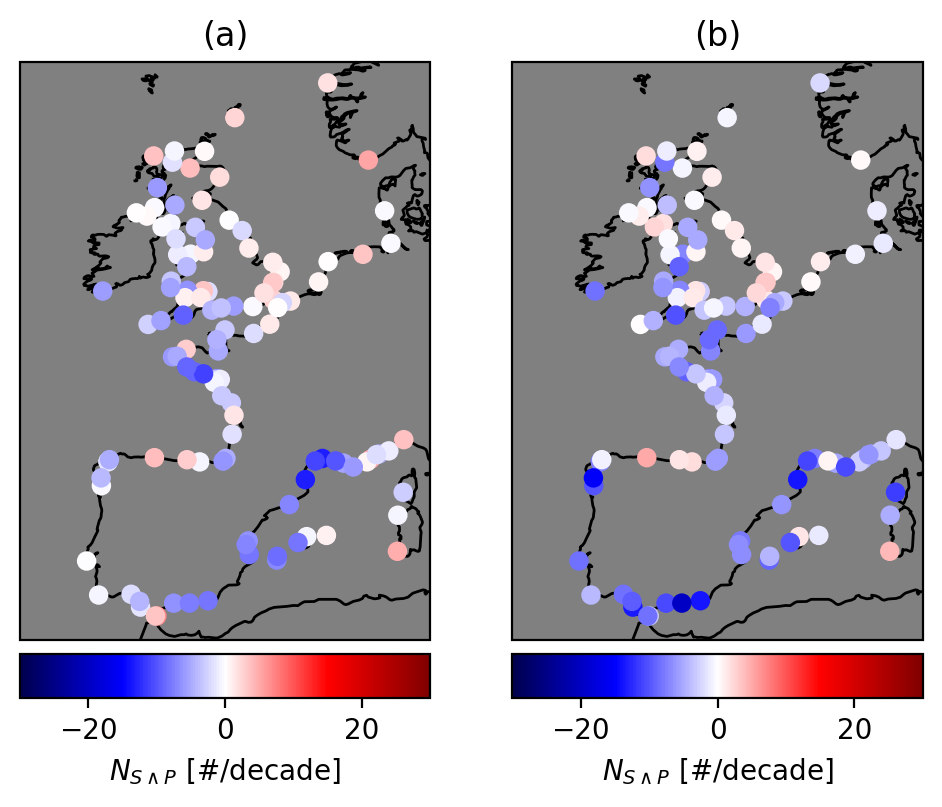

In [12]:
fig=plt.figure(figsize=(9,9.5)) #generate figure  
gs = fig.add_gridspec(2,3)
gs.update(hspace=.2)

    
for s,ssp in enumerate(['ssp585']):
    n_wp_ds = n_wp.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    n_sp_ds = n_sp.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    
    n_wp_ds_present = n_wp_ds.sel(window=2000)#.sel(window=2005)
    n_wp_ds_future = n_wp_ds.sel(window=2080)#.sel(window=2085)
    n_wp_ds_diff = n_wp_ds_future - n_wp_ds_present

    n_sp_ds_present = n_sp_ds.sel(window=2000)#.sel(window=2005)
    n_sp_ds_future = n_sp_ds.sel(window=2080)#.sel(window=2085)
    n_sp_ds_diff = n_sp_ds_future - n_sp_ds_present

    '''
    #wind
    ax = plt.subplot(gs[s,0],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


    sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=(.25*n_wp_ds_present.mean(dim='member_id').mean(dim='source_id'))-num_extremes_mlr_eval.num_cooc_sfcWind,cmap='seismic',vmin=-30,vmax=30,transform=ccrs.PlateCarree(),zorder=3)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*n_wp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{W\wedge P}$ [#/decade]')
    ax.set_title('(a)')
    '''
    #surge
    ax = plt.subplot(gs[s,0],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


    sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=(.25*n_sp_ds_present.mean(dim='member_id').mean(dim='source_id'))-num_extremes_mlr_eval.num_cooc_g3,cmap='seismic',vmin=-30,vmax=30,transform=ccrs.PlateCarree(),zorder=3)
    #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=(.25*n_sp_ds_present.mean(dim='member_id').isel(source_id='GFDL-CM4)-num_extremes_mlr_eval.num_cooc_g3,cmap='seismic',vmin=-30,vmax=30,transform=ccrs.PlateCarree(),zorder=3)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*n_wp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{S\wedge P}$ [#/decade]')
    ax.set_title('(a)')
    
    
    ax = plt.subplot(gs[s,1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


    sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=(.25*n_sp_ds_present.mean(dim='member_id').mean(dim='source_id'))-num_extremes_mlr_eval.num_cooc_mlr_g3,cmap='seismic',vmin=-30,vmax=30,transform=ccrs.PlateCarree(),zorder=3)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*n_wp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{S\wedge P}$ [#/decade]')
    ax.set_title('(b)')
    
    '''
    ax = plt.subplot(gs[s,2],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')


    sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=(.25*n_wp_ds_present.mean(dim='member_id').mean(dim='source_id'))-num_extremes_mlr_eval.num_cooc_sfcWind,cmap='seismic',vmin=-30,vmax=30,transform=ccrs.PlateCarree(),zorder=3)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(n_wp_ds.lon,n_wp_ds.lat,c=.25*n_wp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=ax.inset_axes(bounds=(0, -.1,1,.075))
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$N_{S\wedge P}$ [#/decade]')
    ax.set_title('(c)')
    '''
#fig.savefig('Figures/ensmean_dN_SP_biases.pdf',format='pdf',dpi=300,bbox_inches='tight')


In [12]:
xr.corr(n_sp_ds_present.mean(dim='member_id').mean(dim='source_id'),num_extremes_mlr_eval.num_cooc_g3)

<xarray.DataArray ()>
array(0.76201114)
Coordinates:
    window     int64 2000
    quantile   float64 0.98
    ssp        <U6 'ssp585'
    threshold  float64 0.98

In [13]:
np.sqrt(((.25*n_wp_ds_present.mean(dim='member_id').mean(dim='source_id')-num_extremes_mlr_eval.num_cooc_g3)**2).mean(dim='tg'))/num_extremes_mlr_eval.num_cooc_g3.mean(dim='tg')

<xarray.DataArray ()>
array(0.48960692)
Coordinates:
    window     int64 2000
    height     float64 10.0
    quantile   float64 0.98
    ssp        <U6 'ssp585'
    threshold  float64 0.98

In [14]:
xr.corr(n_sp_ds_present.mean(dim='member_id').mean(dim='source_id'),num_extremes_mlr_eval.num_cooc_mlr_g3)

<xarray.DataArray ()>
array(0.8440552)
Coordinates:
    window     int64 2000
    quantile   float64 0.98
    ssp        <U6 'ssp585'
    threshold  float64 0.98

In [15]:
np.sqrt(((.25*n_wp_ds_present.mean(dim='member_id').mean(dim='source_id')-num_extremes_mlr_eval.num_cooc_mlr_g3)**2).mean(dim='tg'))/num_extremes_mlr_eval.num_cooc_mlr_g3.mean(dim='tg')

<xarray.DataArray ()>
array(0.55932396)
Coordinates:
    window     int64 2000
    height     float64 10.0
    quantile   float64 0.98
    ssp        <U6 'ssp585'
    threshold  float64 0.98

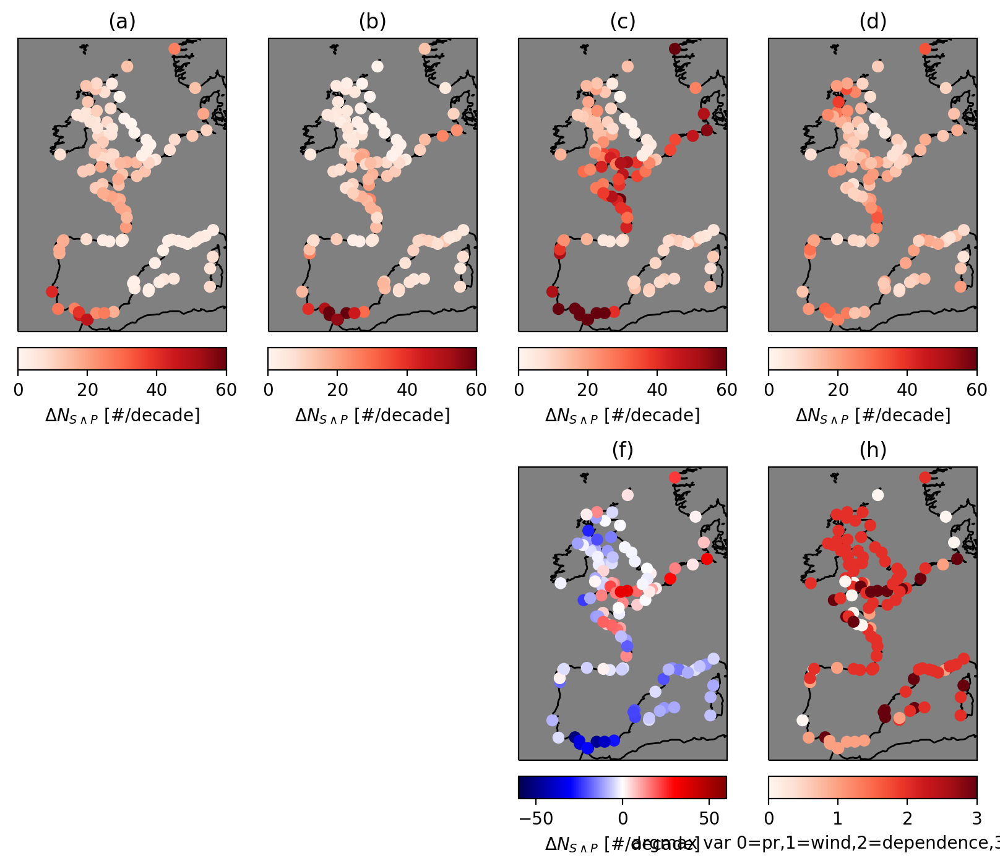

In [22]:
fig=plt.figure(figsize=(10,8.25)) #generate figure  
gs = fig.add_gridspec(2,4)
gs.update(hspace=.2)

    
for s,ssp in enumerate(['ssp585']):
    n_wp_ds = n_wp.sel(ssp=ssp).sum(dim='month',skipna=False)
    n_sp_ds = n_sp.sel(ssp=ssp).sum(dim='month',skipna=False)
    
    n_wp_ds_present = n_wp_ds.sel(window=2000)#.sel(window=2005)
    n_wp_ds_future = n_wp_ds.sel(window=2080)#.sel(window=2085)
    n_wp_ds_diff = n_wp_ds_future - n_wp_ds_present

    n_sp_ds_present = n_sp_ds.sel(window=2000)#.sel(window=2005)
    n_sp_ds_future = n_sp_ds.sel(window=2080)#.sel(window=2085)
    n_sp_ds_diff = n_sp_ds_future - n_sp_ds_present


    #SSP
    ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').var(dim='source_id')),cmap='Reds',vmin=0,vmax=60,transform=ccrs.PlateCarree(),zorder=4)
    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(a)')
    
    
    ax = plt.subplot(gs[0,1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').var(dim='source_id')),cmap='Reds',vmin=0,vmax=60,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(b)')
    
    ax = plt.subplot(gs[0,2],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').var(dim='source_id')),cmap='Reds',vmin=0,vmax=60,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(c)')
    
    
    ax = plt.subplot(gs[0,3],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    dependence_driven = (n_sp_ds_diff.num_joint_extremes-n_sp_ds_diff.num_joint_extremes_surge_pr_driven)
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*dependence_driven.mean(dim='member_id').var(dim='source_id')),cmap='Reds',vmin=0,vmax=60,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(d)')
    
    ##
    var_ds =xr.concat((n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').var(dim='source_id'),n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').var(dim='source_id'),dependence_driven.mean(dim='member_id').var(dim='source_id')),dim='source')
    var_max_ds =xr.concat((var_ds,n_sp_ds_diff.num_joint_extremes.mean(dim='member_id').var(dim='source_id')-var_ds.sum(dim='source')),dim='source')


    ax = plt.subplot(gs[1,2],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*var_max_ds.isel(source=-1)),cmap='seismic',vmin=-60,vmax=60,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(f)')
    
    
    ax = plt.subplot(gs[1,3],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    
    sc=ax.scatter(var_max_ds.dropna(dim='tg').lon,var_max_ds.dropna(dim='tg').lat,c=np.abs(var_max_ds.dropna(dim='tg')).argmax(dim='source',skipna=True),cmap='Reds',vmin=0,vmax=3,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='argmax var 0=pr,1=wind,2=dependence,3=covariance')
    ax.set_title('(h)')
    
    ##### ##### ##### ##### #####
   

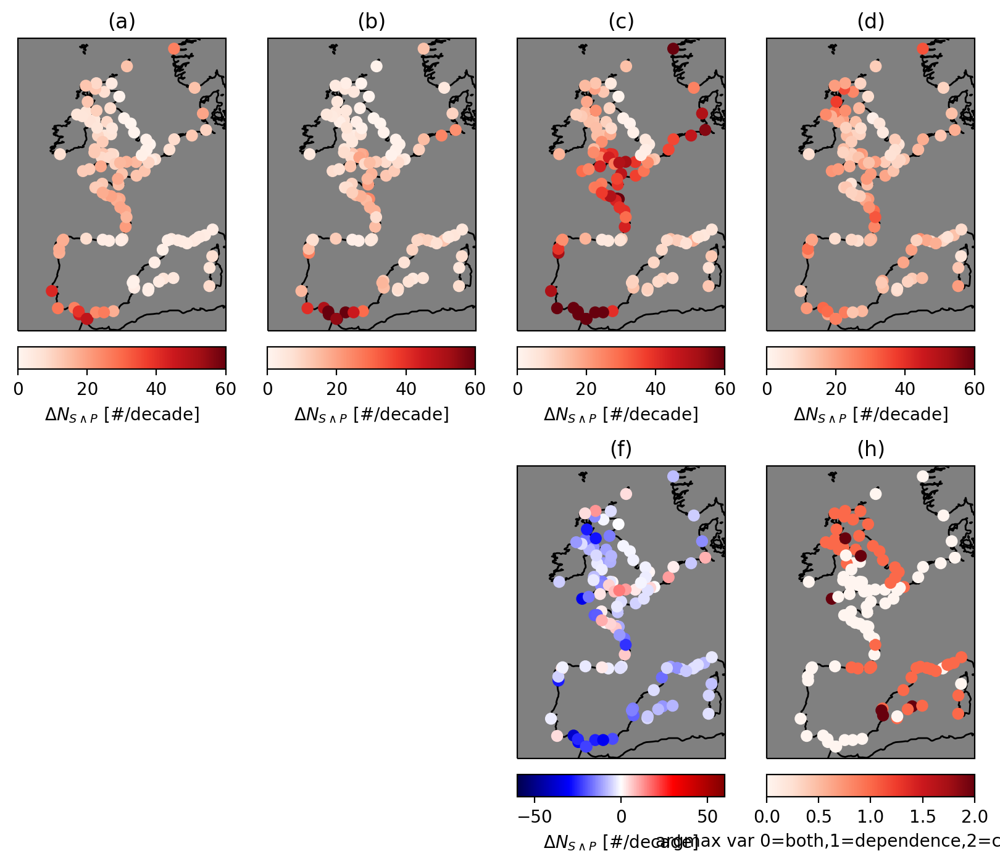

In [24]:
fig=plt.figure(figsize=(10,8.25)) #generate figure  
gs = fig.add_gridspec(2,4)
gs.update(hspace=.2)

    
for s,ssp in enumerate(['ssp585']):
    n_wp_ds = n_wp.sel(ssp=ssp).sum(dim='month',skipna=False)
    n_sp_ds = n_sp.sel(ssp=ssp).sum(dim='month',skipna=False)
    
    n_wp_ds_present = n_wp_ds.sel(window=2000)#.sel(window=2005)
    n_wp_ds_future = n_wp_ds.sel(window=2080)#.sel(window=2085)
    n_wp_ds_diff = n_wp_ds_future - n_wp_ds_present

    n_sp_ds_present = n_sp_ds.sel(window=2000)#.sel(window=2005)
    n_sp_ds_future = n_sp_ds.sel(window=2080)#.sel(window=2085)
    n_sp_ds_diff = n_sp_ds_future - n_sp_ds_present


    #SSP
    ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').var(dim='source_id')),cmap='Reds',vmin=0,vmax=60,transform=ccrs.PlateCarree(),zorder=4)
    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(a)')
    
    
    ax = plt.subplot(gs[0,1],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').var(dim='source_id')),cmap='Reds',vmin=0,vmax=60,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(b)')
    
    ax = plt.subplot(gs[0,2],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').var(dim='source_id')),cmap='Reds',vmin=0,vmax=60,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(c)')
    
    
    ax = plt.subplot(gs[0,3],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    dependence_driven = (n_sp_ds_diff.num_joint_extremes-n_sp_ds_diff.num_joint_extremes_surge_pr_driven)
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*dependence_driven.mean(dim='member_id').var(dim='source_id')),cmap='Reds',vmin=0,vmax=60,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(d)')
    
    ##
    var_ds =xr.concat((n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').var(dim='source_id'),dependence_driven.mean(dim='member_id').var(dim='source_id')),dim='source')
    var_max_ds =xr.concat((var_ds,n_sp_ds_diff.num_joint_extremes.mean(dim='member_id').var(dim='source_id')-var_ds.sum(dim='source')),dim='source')


    ax = plt.subplot(gs[1,2],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    
    sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*var_max_ds.isel(source=-1)),cmap='seismic',vmin=-60,vmax=60,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='$\Delta N_{S\wedge P}$ [#/decade]')
    ax.set_title('(f)')
    
    
    ax = plt.subplot(gs[1,3],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    
    
    sc=ax.scatter(var_max_ds.dropna(dim='tg').lon,var_max_ds.dropna(dim='tg').lat,c=np.abs(var_max_ds.dropna(dim='tg')).argmax(dim='source',skipna=True),cmap='Reds',vmin=0,vmax=2,transform=ccrs.PlateCarree(),zorder=4)

    ax.coastlines(zorder=1)
    #sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=.25*ssp_ds_present.num_co_occurring.mean(dim='member_id').mean(dim='source_id'),cmap='Reds',vmin=0,vmax=30,s=20,transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())

    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(0.04, -.1,1,.075),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label='argmax var 0=both,1=dependence,2=covariance')
    ax.set_title('(h)')
    
    ##### ##### ##### ##### #####
   

ds = ds[['num_co_occurring','num_pr_peaks','num_sfcWind_peaks','complete_window','num_co_occurring_pr_driven','num_co_occurring_sfcWind_driven','num_co_occurring_both_driven']]

Decomposition:

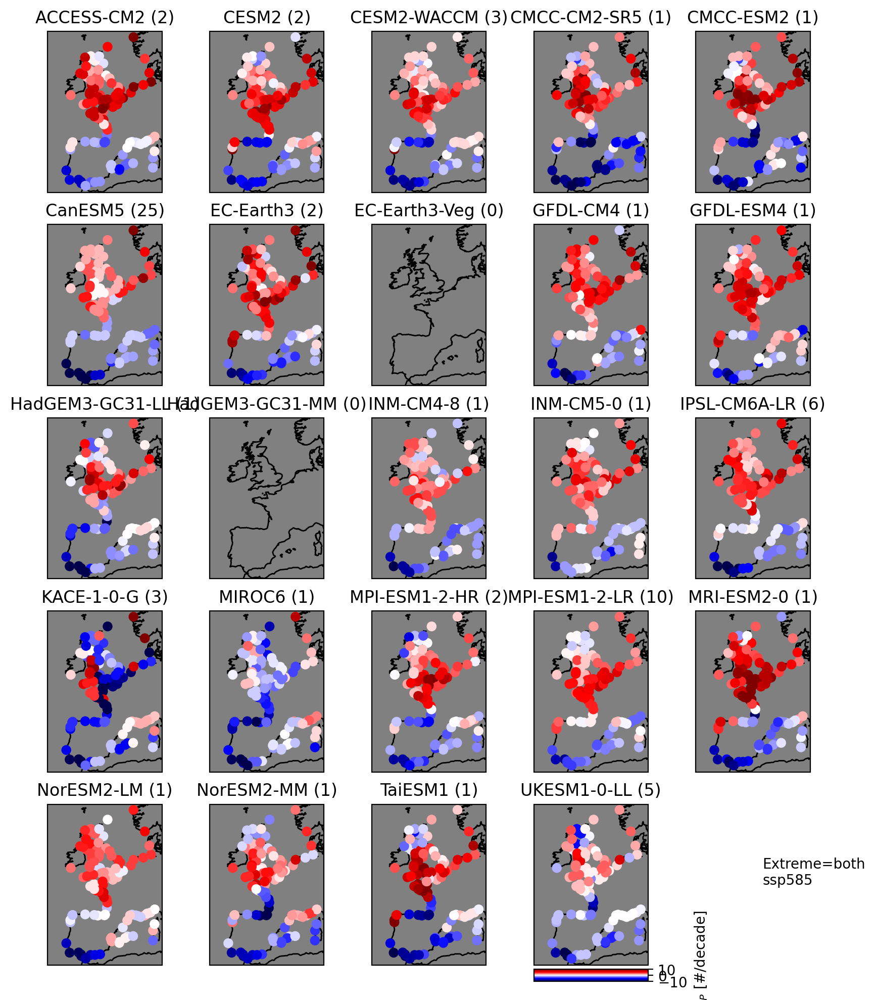

In [14]:
for ssp in ['ssp585']:
    ssp_ds = n_wp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=1980)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(10,12)) #generate figure  
    gs = fig.add_gridspec(5,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(5,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.num_joint_extremes.sel(source_id=model)).sum(dim='member_id')[0].values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=ax.inset_axes(bounds=(0, -.1,1,.075))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')
            ax.annotate('Extreme=both\n'+ssp,(2,.5),xycoords='axes fraction')

In [ ]:
for ssp in ssps:
    ssp_ds = n_sp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=1980)
    ssp_ds_future = ssp_ds.sel(window=2020)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(18,8)) #generate figure  
    gs = fig.add_gridspec(3,8)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,8))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*(ssp_ds_future-ssp_ds_present).num_joint_extremes.sel(source_id=model).mean(dim='member_id')),cmap='seismic',vmin=-30,vmax=30,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.num_joint_extremes.sel(source_id=model)).sum(dim='member_id')[0].values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')
            ax.annotate('Extreme=both\n'+ssp,(2,.5),xycoords='axes fraction')

In [ ]:
for ssp in ['ssp245']:
    ssp_ds = n_sp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(10,12)) #generate figure  
    gs = fig.add_gridspec(5,5)

    for m,mem in enumerate(ssp_ds_present.member_id[np.isfinite(ssp_ds_present.num_joint_extremes.sel(source_id='CanESM5').isel(tg=0))].values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(5,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id='CanESM5').sel(member_id=mem)),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.num_joint_extremes.sel(source_id=model)).sum(dim='member_id')[0].values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')
            ax.annotate('Extreme=both\n'+ssp,(2,.5),xycoords='axes fraction')

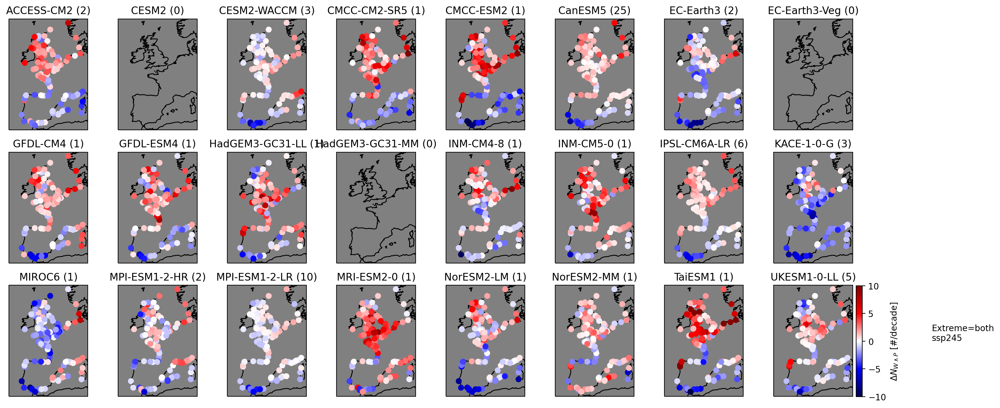

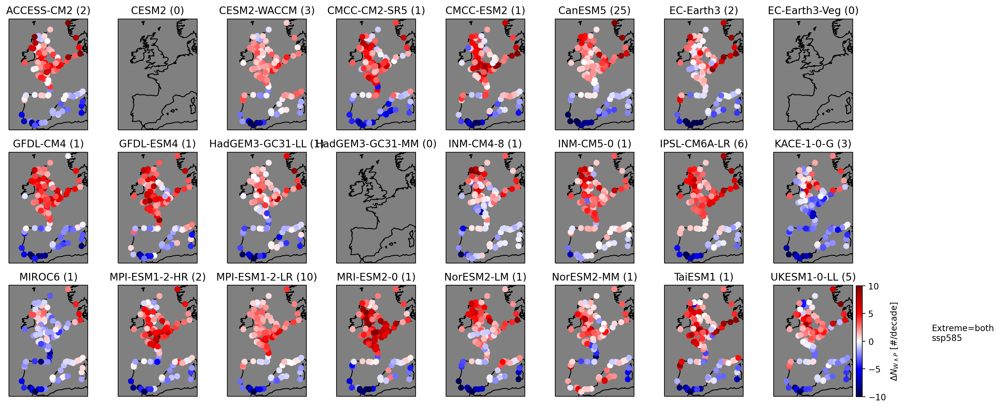

In [34]:
for ssp in ssps:
    ssp_ds = n_sp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(18,8)) #generate figure  
    gs = fig.add_gridspec(3,8)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,8))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.num_joint_extremes.sel(source_id=model)).sum(dim='member_id')[0].values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')
            ax.annotate('Extreme=both\n'+ssp,(2,.5),xycoords='axes fraction')

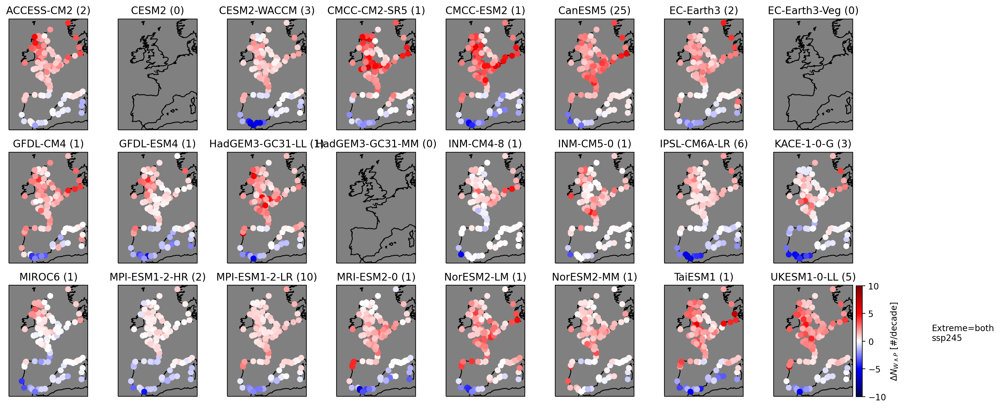

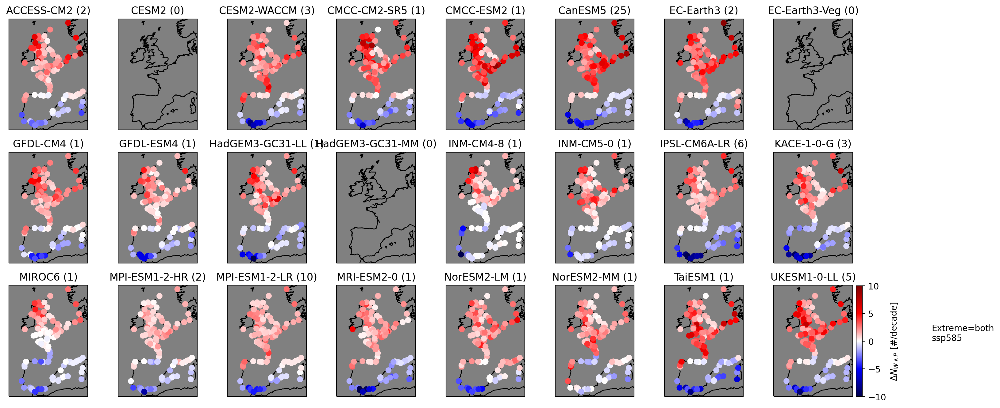

In [17]:
for ssp in ssps:
    ssp_ds = n_wp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(18,8)) #generate figure  
    gs = fig.add_gridspec(3,8)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,8))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.num_joint_extremes_pr_driven.sel(source_id=model).mean(dim='member_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.num_joint_extremes.sel(source_id=model)).sum(dim='member_id')[0].values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')
            ax.annotate('Extreme=both\n'+ssp,(2,.5),xycoords='axes fraction')

AttributeError: 'Dataset' object has no attribute 'num_joint_extremes_surge_driven'

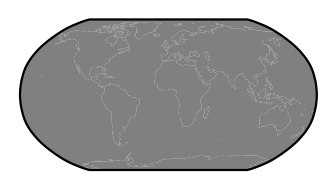

In [13]:
for ssp in ssps:
    ssp_ds = n_wp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(18,8)) #generate figure  
    gs = fig.add_gridspec(3,8)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,8))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.num_joint_extremes_surge_driven.sel(source_id=model).mean(dim='member_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.num_joint_extremes.sel(source_id=model)).sum(dim='member_id')[0].values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')
            ax.annotate('Extreme=both\n'+ssp,(2,.5),xycoords='axes fraction')

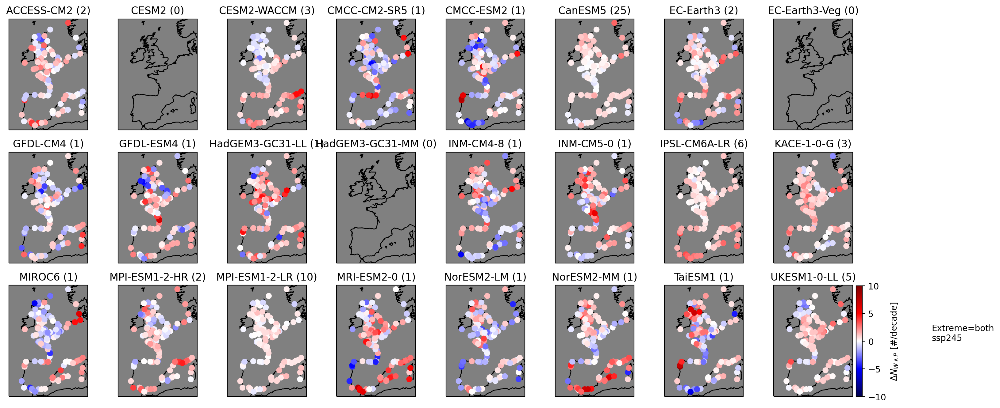

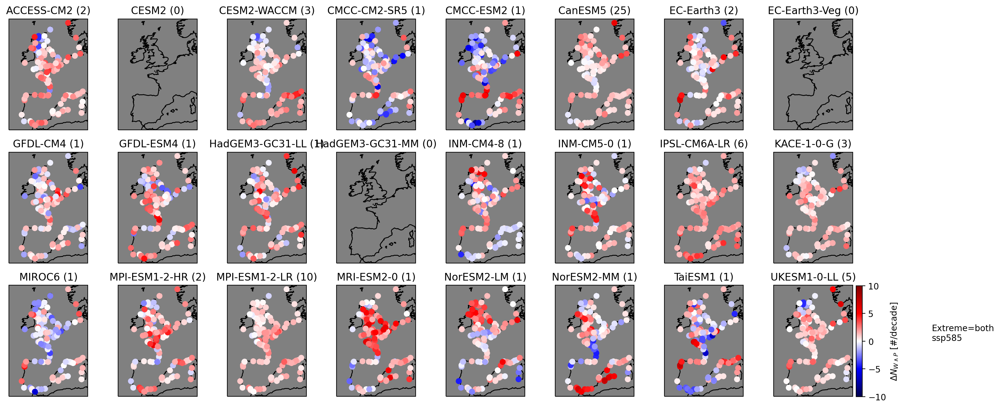

In [19]:
for ssp in ssps:
    ssp_ds = n_wp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(18,8)) #generate figure  
    gs = fig.add_gridspec(3,8)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,8))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        dependence_driven = (ssp_ds_diff.num_joint_extremes-ssp_ds_diff.num_joint_extremes_surge_pr_driven)

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*dependence_driven.sel(source_id=model).mean(dim='member_id')),cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.num_joint_extremes.sel(source_id=model)).sum(dim='member_id')[0].values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')
            ax.annotate('Extreme=both\n'+ssp,(2,.5),xycoords='axes fraction')